# В случае большого количества границ, border будем использовать как номер правой границы. Это не подходит к элементам со значением border = 0. Для них первый разрыв будет либо на бесконечности, если граничные условия не зациклины, либо последний разрыв, если они зациклены.

In [26]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from scipy.linalg import solve
from IPython.display import HTML
from collections import deque

In [27]:
class Edge:
    """
    alpha, beta - параметры среды, в которой находится ячейка;
    x - координата центра;
    values - массив из значений, где values[0] - p, values[1] - v;
    border - 1, если по правую сторону от незамкнутого рахрыва или внутри замкунтого, иначе - 0;
    border_pos - позиция разрыва слева. Если разрыва нет, то считаем, что он на бесконенчости и все точки внутри области
    """
    alpha = None
    beta = None
    x = None
    values = [0, 0]
    border = 0
    border_pos = float('-inf')
    def __init__ (self, x: float, values: list[float], alpha: float, beta: float, border: float = 0, border_pos = float('-inf')):
        self.x = x
        self.values = values[:]
        self.alpha = alpha
        self.beta = beta
        if border_pos != float('-inf'):
            self.border = border
            self.border_pos = border_pos
        else:
            # self.border = 1
            self.border_pos = border_pos

    def set_values(self, values: list[float]) -> None:
        self.values = values.copy()

    def get_values(self) -> list[float]:
        return self.values
    

    def get_position(self) -> float:
        return self.x
    
    def get_border_status(self) -> int:
        return self.border
    
    def get_params(self) -> list[float]:
        return [self.alpha, self.beta]
    
    def get_border_pos(self) -> float:
        return self.border_pos
    
    def get_area(self, t: float) -> int:
        """
        Этот метод будет показывать, в какой области находится центр ячейки.
        Если он внутри разрыва border = 1, то проверка на то, x > border_pos + c_2 * t.
        Если он снаружи разрыва border = 0, то проверка на то, что x < border_pos - c_1 * t.
        По этому весь рассматриваемый объем будем делить на 4 области: 1, 2, 3, 4.
        Картинка с пояснением:

         1   \ 2|3 / 4
              \ | /
               \|/
        --------|----------
        Метод возвращает порядковый номер области.
        
        ДЛЯ СЛУЧАЯ НЕСКОЛЬКИХ ГРАНИЦ, ОТКАЖЕМСЯ ОТ НЕГО
        """
        if self.border == 1:
            if self.x > self.border_pos + np.sqrt(self.alpha * self.beta) * t:
                return 4
            return 3
        elif self.x < self.border_pos - np.sqrt(self.alpha * self.beta) * t:
            return 1
        return 2


# Параметры среды

In [28]:
"""Задаем начальные параметры. Будем исследовать на промежутке [-1, 1]"""
borders_number = 2
n_edges = 400
# alpha_1, beta_1 = 1, 1
# alpha_2, beta_2 = 8, 0.5
alpha_data = [1, 4, 8, 16] # массив параметров alpha для сред
beta_data = [1, 0.5, 0.25, 0.125] # массив параметров beta для сред

# alpha_data = [1, 4] # массив параметров alpha для сред
# beta_data = [1, 0.5] # массив параметров beta для сред

# alpha_data = list(reversed([1, 4, 8])) # массив параметров alpha для сред
# beta_data = list(reversed([1, 0.5, 0.25])) # массив параметров beta для сред

L = -1 # Левая граница
R = 1 # Правая граница
T = 0.45# максимальное время
""" tau будем подбирать так, чтобы она попадала в середину решетки для максимальной скорости звука"""
# tau = 0.001 # Шаг по времени
tau = 0.8 * (R - L) / n_edges / max(np.sqrt(np.multiply(alpha_data, beta_data)))
border_position = -0.103 # позиция разрыва 
border_delta_data = [0, 0.2, 0.35] # массив расстояний всех границ до точки border_position
# border_delta_data = [0] # массив расстояний всех границ до точки border_position
border_delta_data = [float('-inf')] + border_delta_data.copy() + [float('inf')]

L_b = - 0.35
R_b = - 0.15
print(tau)

0.00282842712474619


# Начальные данные

In [29]:
#  У нас будет начальное возмущение sin^4(x) если x = [0, pi], и x = 0 в другом случае. Пусть начальная скорость = 0. Начальное возмущение будет только у давления.


def inintial_velocity_function(x: float) -> float:
    """
    Задает начальное распределение скорости
    Параметры:
        x (float): координата ячейки
    """
    # a = np.pi / (R_b - L_b) 
    # b =  - np.pi * L_b / (R_b - L_b)
    # if x > L_b and x < R_b: 
    #     return 2 * np.sin(a * x + b) ** 4
    return 0

def initial_pressure_function(x: float) -> float:
    """
    Задает начальное распределение давления
    Параметры:
        x (float): координата ячейки
    Преборазование таким образом, чтобы [L_b, R_b] -> [0, pi].
    Для этого определим коэффициенты линейного преобразование:
    a * x + b
    """
    a = np.pi / (R_b - L_b) 
    b =  - np.pi * L_b / (R_b - L_b)
    if x > L_b and x < R_b: 
        return 2 * np.sin(a * x + b) ** 4
    return 0 

In [30]:
def edge_parameters_to_border(x_cord: float) -> list[float]:
    """
    Функция возвращает параметры среды и border_pos в зависимости от координаты ячейки.
    Параметры:
        x_cord (float): координата ячейки
    """
    # Добавим два искусственныйх разрыва на бесконечностях
    # prom_border_delta_data = [float('-inf')] + border_delta_data.copy() + [float('inf')]
    # Такие пределы, чтобы не учитывать 2 добавленных позициии разрывов
    for index in range(len(border_delta_data) - 1):
        if x_cord > border_position + border_delta_data[index] and x_cord < border_position + border_delta_data[index + 1]:
            return [index, alpha_data[index], beta_data[index]]
    # index = len(border_delta_data) - 1
    # return [index, alpha_data[index], beta_data[index]]

In [31]:
initial_data = []
for edge in range(n_edges + 1):
    x_cord = L + edge * (R - L) / n_edges
    # p = v = 0
    
    border_index_prom, alpha_prom, beta_prom = edge_parameters_to_border(x_cord)
    v = inintial_velocity_function(x_cord)
    p = initial_pressure_function(x_cord)

    if x_cord == border_position + border_delta_data[border_index_prom]:
        print('Yes')
    # print(border_index_prom)
    if border_index_prom == 0:
        initial_data.append(Edge(x=x_cord, values=[p, v], alpha=alpha_prom, beta=beta_prom))
    else:
        initial_data.append(Edge(x=x_cord, 
                                 values=[p, v], alpha=alpha_prom, beta=beta_prom, border=border_index_prom, border_pos=border_position + border_delta_data[border_index_prom]))

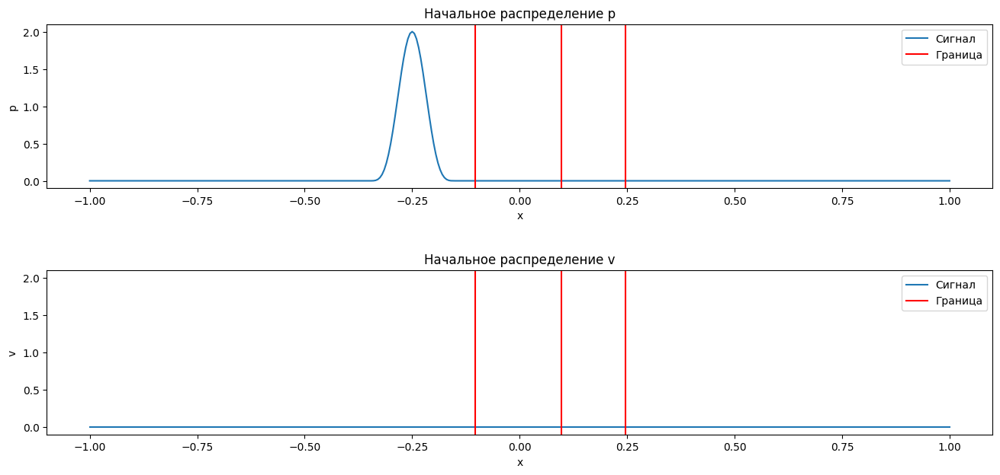

In [32]:
p_v_data = np.array([i.get_values() for i in initial_data])
x_data = [i.get_position() for i in initial_data]

fig = plt.figure(figsize=(16, 7))
values = ['p', 'v']
axs = fig.subplots(2, 1)

for ax, i in zip(axs, range(2)):
    ax.plot(x_data, p_v_data[:, i], label='Сигнал')
    for border_delta in border_delta_data:
        if abs(border_delta) != float('inf'):
            if border_delta == 0:
                ax.axvline(x = border_position + border_delta, color = 'r', label = 'Граница')
            else: 
                ax.axvline(x = border_position + border_delta, color = 'r')
    ax.set_ylim(-0.1, 2.1)
    ax.legend()
    ax.set_xlabel('x')
    ax.set_ylabel(values[i])
    ax.set_title(f'Начальное распределение {values[i]}')
# fig.suptitle('Начальные распределения')
plt.subplots_adjust(hspace=0.5)
plt.show()

# Аналитическое решение

In [33]:
def analitic_get_initial_data(t: float, edge_coord: float, edge: Edge  = None, left_index: int = None, right_index: int = None, alpha_beta_1: list[float] = None, alpha_beta_2: list[float] = None) -> np.ndarray:
    '''
    Метод позволяет найти аналитическое решение.
    Возвращает массив [p, v].
    Алгоритм будет следующим: переходим к переменным в инвариантах Риммана w+ и w-.
    Решаем для них уравнение переноса и потом возвращаеся обратно в переменные p, v.
    Если одна из характеристик попадает на границу, то для нее точно так же решаем задачу нахождения [p, v],
    а потом используем точку на характеристике как доп. точку.
    Тут будем использовать обозначения:
        Z = sqrt(alpha / beta) - акустический импеданс;
        R = [[Z, -Z], [1, 1]] - матрица собственных векторов.
    Параметры:
        t (float): Момент времени, для которого нужно рассчитать решение;
        edge_coord (float): координата, для которой происходит сейчас расчет(при начальном вызове обычно это координата узла);
        edge (Edge): экземпляр класса ячейки;
        left_index ;
        right_index ;
        alpha_beta_1 (list[float]): массив с параметрами для ячеек до разрыва для расчета в левой области;
        alpha_beta_2 (list[float]): массив с параметрами для ячеек после разрыва для расчета в правой области.
    '''

    Z_L = np.sqrt(alpha_beta_1[0] / alpha_beta_1[1])
    Z_R = np.sqrt(alpha_beta_2[0] / alpha_beta_2[1])

    R_L = np.array([Z_L, -Z_L, 1, 1]).reshape(2, 2)
    R_R = np.array([Z_R, -Z_R, 1, 1]).reshape(2, 2)
    # R = np.array([Z, -Z, 1, 1]).reshape(2, 2)

    w_positive = 0
    w_negative = 0

    # Условие, которое проверяет, сейчас идет расчет для узла или для точки на границе. 
    if edge.get_position() == edge_coord:
        left_index, right_index = edge.get_border_status(), edge.get_border_status() + 1
    
    

    # Проверка на то, пересекает ли характеристика левую границу и на то, что это точка левее всех границ(условие на index, но условие на индекс нужно переделать в случае с зациклиными границами)
    if left_index > 0 and edge_coord < border_position + border_delta_data[left_index] + np.sqrt(np.multiply(*alpha_beta_1)) * t:
        t_tilda = t + (border_position + border_delta_data[left_index] - edge_coord) / np.sqrt(np.multiply(*alpha_beta_1))
        new_right_index = right_index
        new_left_index = left_index
        
        if edge.get_position() == edge_coord:
            new_left_index -= 1
        else:
            new_right_index -= 1
            new_left_index -= 1
        
        p_v_values = analitic_get_initial_data( t=t_tilda,
                                                edge_coord=border_position + border_delta_data[left_index],
                                                edge=edge,
                                                left_index=new_left_index,
                                                right_index=new_right_index,
                                                alpha_beta_1=[alpha_data[new_left_index], beta_data[new_left_index]], 
                                                alpha_beta_2=[alpha_data[new_right_index - 1], beta_data[new_right_index - 1]]).reshape(-1 ,1)
        w_positive = np.matmul(np.linalg.inv(R_L), p_v_values)[0]
    else:
        x_L = edge_coord - np.sqrt(np.multiply(*alpha_beta_1)) * t
        w_positive = np.matmul(np.linalg.inv(R_L), np.array(analitic_get_left_initial_data_values(x_L)).reshape(-1, 1))[0]


    
    # Проверка на то, пересекает ли характеристика правую границу
    if right_index < len(border_delta_data) - 1 and edge_coord > border_position + border_delta_data[right_index] - np.sqrt(np.multiply(*alpha_beta_2)) * t:
        t_tilda = t - (border_position + border_delta_data[right_index] - edge_coord) / np.sqrt(np.multiply(*alpha_beta_2))
        new_right_index = right_index
        new_left_index = left_index

        if edge.get_position() == edge_coord:
            new_right_index += 1
        else:
            new_right_index += 1
            new_left_index += 1
        
        p_v_values = analitic_get_initial_data( t=t_tilda,
                                                edge_coord=border_position + border_delta_data[right_index],
                                                edge=edge,
                                                left_index=new_left_index,
                                                right_index=new_right_index,
                                                alpha_beta_1=[alpha_data[new_left_index], beta_data[new_left_index]], 
                                                alpha_beta_2=[alpha_data[new_right_index - 1], beta_data[new_right_index - 1]]).reshape(-1 ,1)
        w_negative = np.matmul(np.linalg.inv(R_R), p_v_values)[1]
    else:
        x_R = edge_coord + np.sqrt(np.multiply(*alpha_beta_2)) * t
        w_negative = np.matmul(np.linalg.inv(R_R), np.array(analitic_get_right_initial_data_values(x_R)).reshape(-1, 1))[1]

    # if edge.get_border_status() == 1:
    #     print(left_index, right_index)
    p = 2 * (w_positive - w_negative) * Z_L * Z_R / (Z_L + Z_R)
    v = 2 * (Z_L * w_positive + Z_R * w_negative) / (Z_L + Z_R)
    return np.array([p, v])
    """
    СТАРЫЙ КОД ДЛЯ ОДНОЙ ГРАНИЦЫ
    position = 1
    
    if position == 1 or position == 4: 
        # alpha, beta = edge.get_params()
        # Z = np.sqrt(alpha / beta)
        # R = np.array([Z, -Z, 1, 1]).reshape(2, 2)
        x_L = edge.get_position() - np.sqrt(alpha * beta) * t
        x_R = edge.get_position() + np.sqrt(alpha * beta) * t
        w_positive, w_negative = np.matmul(np.linalg.inv(R), np.array(analitic_get_left_initial_data_values(x_L)).reshape(-1, 1))[0],\
                                 np.matmul(np.linalg.inv(R), np.array(analitic_get_right_initial_data_values(x_R)).reshape(-1, 1))[1]
        return np.matmul(R, np.array([w_positive, w_negative]).reshape(-1, 1))
    
    elif position == 2:
        # alpha, beta = edge.get_params()
        # Z = np.sqrt(alpha / beta)
        # R = np.array([Z, -Z, 1, 1]).reshape(2, 2)
        x_L = edge.get_position() - np.sqrt(alpha * beta) * t
        # Далее находим точку, где хар-ка ппересекает границу
        t_tilda = t - (border_pos - edge.get_position()) / np.sqrt(alpha * beta)
        w_positive, w_negative = np.matmul(np.linalg.inv(R), np.array(analitic_get_left_initial_data_values(x_L)).reshape(-1, 1))[0],\
                                 np.matmul(np.linalg.inv(R), analitic_get_initial_data(t=t_tilda, border_pos=edge.get_border_pos(), alpha_beta_1=alpha_beta_1, alpha_beta_2=alpha_beta_2, border_flag=True))[1]
        return np.matmul(R, np.array([w_positive, w_negative]).reshape(-1, 1))
    
    elif position == 3:
        # alpha, beta = edge.get_params()
        # Z = np.sqrt(alpha / beta)
        # R = np.array([Z, -Z, 1, 1]).reshape(2, 2)
        x_R = edge.get_position() + np.sqrt(alpha * beta) * t
        # Далее находим точку, где хар-ка ппересекает границу
        t_tilda = t + (border_pos - edge.get_position()) / np.sqrt(alpha * beta)
        w_positive, w_negative = np.matmul(np.linalg.inv(R), analitic_get_initial_data(t=t_tilda, border_pos=edge.get_border_pos(), alpha_beta_1=alpha_beta_1, alpha_beta_2=alpha_beta_2, border_flag=True))[0],\
                                 np.matmul(np.linalg.inv(R), np.array(analitic_get_right_initial_data_values(x_R)).reshape(-1, 1))[1]
        return np.matmul(R, np.array([w_positive, w_negative]).reshape(-1, 1))

    raise KeyError(f'Если дошло до этого момента, то произошла какая-то херня, Position = {position}')
    """



def analitic_get_left_initial_data_values(x_L: float) -> np.ndarray:
    """
    Значения на характеристике с lambda = c
    Параметры:
        x_R (float): координата точки, где хар-ка пересекает координатную плоскость в нулевой момент времени
    """
    if x_L < -1:
        p_v_vector_L = [0, 0]
        return p_v_vector_L
    else:
        p_v_vector_L = [initial_pressure_function(x_L), inintial_velocity_function(x_L)]
        return p_v_vector_L
    

def analitic_get_right_initial_data_values(x_R: float) -> np.ndarray:
    """
    Значения на характеристике с lambda = - c
    Параметры:
        x_R (float): координата точки, где хар-ка пересекает координатную плоскость в нулевой момент времени
    """
    if x_R > 1:
        p_v_vector_R = [0, 0]
        return p_v_vector_R
    else:
        p_v_vector_R = [initial_pressure_function(x_R), inintial_velocity_function(x_R)]
        return p_v_vector_R



# def analitic_get_left_initial_data_values(x_L: float, x_R: float) -> np.ndarray:
#     p_v_vector_L = []
#     p_v_vector_R = []
#     if x_L < -1:
#         p_v_vector_L = [0, 0]

#     if x_R > 1:
#         p_v_vector_R = [0, 0]
#     if len(p_v_vector_L) == 0:
#         p_v_vector_L = [inintial_velocity_function(x_L), initial_pressure_function(x_L)]

#     if len(p_v_vector_R) == 0:
#         p_v_vector_R = [inintial_velocity_function(x_R), initial_pressure_function(x_R)]

#     return np.array([p_v_vector_L, p_v_vector_R])
    

    
          


In [ ]:
# # Аналитическое решение

analitic_data = []
for edge in range(n_edges + 1):
    x_cord = L + edge * (R - L) / n_edges
    # p = v = 0
    if x_cord == border_position:
        print('Yes')
    border_index_prom, alpha_prom, beta_prom = edge_parameters_to_border(x_cord)
    v = inintial_velocity_function(x_cord)
    p = initial_pressure_function(x_cord)
    if border_index_prom == 0:
        analitic_data.append(Edge(x=x_cord, values=[p, v], alpha=alpha_prom, beta=beta_prom))
    else:
        analitic_data.append(Edge(x=x_cord, 
                                 values=[p, v], alpha=alpha_prom, beta=beta_prom, border=border_index_prom, border_pos=border_position + border_delta_data[border_index_prom]))


fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 7))
# fig, ax = plt.subplots()
ax1.set_xlim(-1, 1)
ax1.set_ylim(-0.1, 2.1)
ax1.set_xlabel('x')
ax1.set_ylabel('p')

ax2.set_xlim(-1, 1)
ax2.set_ylim(-1.1, 1.1)
ax2.set_xlabel('x')
ax2.set_ylabel('v')


p_v_data = np.array([i.get_values() for i in analitic_data])
x_data = [i.get_position() for i in analitic_data]

line1, = ax1.plot(x_data, p_v_data[:, 0], label='Сигнал')
for border_delta in border_delta_data:
        ax1.axvline(x = border_position + border_delta, color = 'r', label = 'Граница')

line2, = ax2.plot(x_data, p_v_data[:, 1], label='Сигнал')
for border_delta in border_delta_data:
        ax2.axvline(x = border_position + border_delta, color = 'r', label = 'Граница')
plt.subplots_adjust(hspace=0.5)
plt.suptitle('Аналитическое решение')
time_template = 'time = %.2fs'
time_text = plt.text(0.05, 3.1, '', transform=ax.transAxes)
def init():
    time_text.set_text('')
    return line1, line2, time_text

def animate(i):
    # print('\n', i, '\n')
    x = np.array([edges.get_position() for edges in analitic_data])
    y = np.array([analitic_get_initial_data(t=i,edge_coord=edges.get_position(), edge=edges, left_index=edges.get_border_status(), right_index=edges.get_border_status() + 1, alpha_beta_1=edges.get_params(), alpha_beta_2=edges.get_params()) for edges in analitic_data])

    line1.set_data(x, y[:, 0])
    line2.set_data(x, y[:, 1])
    
    time_text.set_text(time_template % (i))    

    
    return line1, line2, time_text

for delta_border in border_delta_data:
    plt.axvline(x = border_position + delta_border, color = 'r', label = 'Граница')
ani = animation.FuncAnimation(fig, animate, np.arange(0, T, tau), interval=50000 * tau, blit=True)

plt.close()
HTML(ani.to_jshtml())

# Численное решение

In [34]:
def scheme_Rusanov_delta_positive(alpha_beta: float, edge_m_n2: Edge, edge_m_n1: Edge, edge_m: Edge, edge_m_p1: Edge):
    """
    Метод, реализующий схему Русанова 3-го порядка малости.
    Случай собственного значения > 0.
    Где delta = u_(i-1) - u_i
    Параметры:
        alpha_beta (float): параметры среды;
        edge_m_n2 (Edge): узел через один в обратную сторону относительно m-го в момент времени t;
        edge_m_n1 (Edge): предыдущий узел относительно m-го в момент времени t;
        edge_m (Edge): узел в момент времени t, для которого в момент времени t+1 ведется расчет;  
        edge_m_p1 (Edge): следующий узел относительно m-го в момент времени t;
    sound_velocity = sqrt(alpha * beta) сокрость звука, которая является собственным значением уравнений акустики
    число Куранта = lambda * tau / h = sound_velocity * tau / h
                o      t+1
                |
        o---o---o---o  t
       m-2 m-1  m   m+1
      m_n2 m_n1 m   m_p1
    """
    sound_velocity = np.sqrt(np.multiply(*alpha_beta))
    sigma = np.array(sound_velocity * tau / ((R - L) / n_edges))
    Z = np.sqrt(alpha_beta[0] / alpha_beta[1])
    R_matrix = np.array([Z, -Z, 1, 1]).reshape(2, 2)

    u_m_n2 = np.matmul(np.linalg.inv(R_matrix), np.array(edge_m_n2.get_values()).reshape(-1, 1)).reshape(-1)[0]
    u_m_n1 = np.matmul(np.linalg.inv(R_matrix), np.array(edge_m_n1.get_values()).reshape(-1, 1)).reshape(-1)[0]
    u_m = np.matmul(np.linalg.inv(R_matrix), np.array(edge_m.get_values()).reshape(-1, 1)).reshape(-1)[0]
    u_m_p1 = np.matmul(np.linalg.inv(R_matrix), np.array(edge_m_p1.get_values()).reshape(-1, 1)).reshape(-1)[0]

    delta_m = u_m_n1 - u_m
    delta_m_p1 = u_m - u_m_p1
    delta_m_n1 = u_m_n2 - u_m_n1

    
    u_next = u_m + 0.5 * sigma * (delta_m + delta_m_p1) + 0.5 * (sigma ** 2) * (delta_m - delta_m_p1) + (1/6) * sigma * (sigma ** 2 - 1) * (delta_m_n1 - 2 * delta_m + delta_m_p1)
    return u_next 



def scheme_Rusanov_delta_negative(alpha_beta: float, edge_m_n1: Edge, edge_m: Edge, edge_m_p1: Edge, edge_m_p2: Edge):
    """
    Метод, реализующий схему Русанова 3-го порядка малости.
    Случай собственного значения < 0. Схема симметрична отражена относительно edge_m.
    Где delta = u_(i+1) - u_i
    Параметры:
        alpha_beta (float): параметры среды;
        edge_m_n1 (Edge): предыдущий узел относительно m-го в момент времени t;
        edge_m (Edge): узел в момент времени t, для которого в момент времени t+1 ведется расчет;  
        edge_m_p1 (Edge): следующий узел относительно m-го в момент времени t;
        edge_m_p2 (Edge): узел через один вперед относительно m-го в момент времени t;
    sound_velocity = sqrt(alpha * beta) сокрость звука, которая является собственным значением уравнений акустики
    число Куранта = lambda * tau / h = sound_velocity * tau / h
            o          t+1
            |    
        o---o---o---o  t
       m-1  m  m+1 m+2
      m_n1  m m_p1 m_p2
    """
    sound_velocity = np.sqrt(np.multiply(*alpha_beta))
    sigma = np.array(sound_velocity * tau / ((R - L) / n_edges))
    Z = np.sqrt(alpha_beta[0] / alpha_beta[1])
    R_matrix = np.array([Z, -Z, 1, 1]).reshape(2, 2)

    
    u_m_n1 = np.matmul(np.linalg.inv(R_matrix), np.array(edge_m_n1.get_values()).reshape(-1, 1)).reshape(-1)[1]
    u_m = np.matmul(np.linalg.inv(R_matrix), np.array(edge_m.get_values()).reshape(-1, 1)).reshape(-1)[1]
    u_m_p1 = np.matmul(np.linalg.inv(R_matrix), np.array(edge_m_p1.get_values()).reshape(-1, 1)).reshape(-1)[1]
    u_m_p2 = np.matmul(np.linalg.inv(R_matrix), np.array(edge_m_p2.get_values()).reshape(-1, 1)).reshape(-1)[1]

    delta_m = u_m_p1 - u_m
    delta_m_p1 = u_m - u_m_n1 
    delta_m_n1= u_m_p2 - u_m_p1

    u_next = u_m + 0.5 * sigma * (delta_m + delta_m_p1) + 0.5 * (sigma ** 2) * (delta_m - delta_m_p1) + (1/6) * sigma * (sigma ** 2 - 1) * (delta_m_n1 - 2 * delta_m + delta_m_p1)
    return u_next 

In [35]:
def velocity_polinom_medium_border(edge_n2: Edge, edge_n1: Edge, edge_p1: Edge, edge_p2: Edge, alpha_beta_1: list[float], alpha_beta_2: list[float], border_pos: float) -> np.ndarray:
    """
    Функция для апроксимации 2х наиболее близских точек от разрыва с каждой стороны.
    Строит полиномы и возвращает коэффициенты этих полиномов.
    Параметры:
        alpha_beta_1 (list[float]): массив параметров стреды до разрыва, хранится ввиде [alpha, beta]
        alpha_beta_2 (list[float]): массив параметров стреды после разрыва, хранится ввиде [alpha, beta]
        edge_n2 (Edge): Экземпяр кслааса для второй точки от границы влево
        edge_n1 (Edge): Экземпяр кслааса для первой точки от границы влево
        edge_p1 (Edge): Экземпяр кслааса для первой точки от границы вправо
        edge_p2 (Edge): Экземпяр кслааса для второй точки от границы вправо
        border_pos (float): позиция разрыва

          |
          |
    o---o-|-o---o
    n2 n1 | p1  p2
          |
        border

    Получаем полином для скорости.
    Полином имеет вид:
        Q(x) = a * (x - x_border) ** 3 + b * (x - x_border) ** 2 + c * (x - x_border) + d
    Будем решать систему для 8 неизвестных с 8ю уравнениями, где неизвестные:
    a1, b1, c1, d1, a2, b2, c2, d2.
    А уравнени системы:
        первые 4 - полученны из значений Q(x),
        А второые 4 - получены из соотношений коэффициентов
    """
    delta_x_n2 = edge_n2.get_position() - border_pos
    delta_x_n1 = edge_n1.get_position() - border_pos
    delta_x_p1 = edge_p1.get_position() - border_pos
    delta_x_p2 = edge_p2.get_position() - border_pos

    v_n2 = edge_n2.get_values()[1]
    v_n1 = edge_n1.get_values()[1]
    v_p1 = edge_p1.get_values()[1] 
    v_p2 = edge_p2.get_values()[1]

    f = np.array([v_n2, v_n1, v_p1, v_p2, 0, 0, 0, 0]).reshape(-1, 1)
    A = np.array([delta_x_n2 ** 3, delta_x_n2 ** 2, delta_x_n2, 1, 0, 0, 0, 0,
                  delta_x_n1 ** 3, delta_x_n1 ** 2, delta_x_n1, 1, 0, 0, 0, 0,
                  0, 0, 0, 0, delta_x_p1 ** 3, delta_x_p1 ** 2, delta_x_p1, 1,
                  0, 0, 0, 0, delta_x_p2 ** 3, delta_x_p2 ** 2, delta_x_p2, 1,
                  0, 0, 0, 1, 0, 0, 0, -1,
                  0, 0, alpha_beta_1[0], 0, 0, 0, -alpha_beta_2[0], 0,
                  0, np.multiply(*alpha_beta_1), 0, 0, 0, -np.multiply(*alpha_beta_2), 0, 0,
                  np.multiply(*alpha_beta_1) * alpha_beta_1[0], 0, 0, 0, -np.multiply(*alpha_beta_2) * alpha_beta_2[0], 0, 0, 0]).reshape(8, 8)
    
    return solve(A, f)

def velocity_polinom_far_border(edge_n2: Edge, edge_n1: Edge, edge_n0: Edge, edge_p1: Edge, alpha_beta_1: list[float], alpha_beta_2: list[float], border_pos: float, reverse: bool = False) -> np.ndarray:
    """
    Функция для апроксимации, если только одна точка находится за границей.
    Строит полиномы и возвращает коэффициенты этих полиномов.
    Параметры:
        alpha_beta_1 (list[float]): массив параметров стреды до разрыва, хранится ввиде [alpha, beta]
        alpha_beta_2 (list[float]): массив параметров стреды после разрыва, хранится ввиде [alpha, beta]
        edge_n2 (Edge): Экземпяр кслааса для второй точки от границы влево
        edge_n1 (Edge): Экземпяр кслааса для первой точки от границы влево
        edge_n0 (Edge): Экземпяр кслааса для первой точки от границы вправо
        edge_p2 (Edge): Экземпяр кслааса для второй точки от границы вправо
        border_pos (float): позиция разрыва
        reverse (bool): отраженная схема, изначанльна имеет вид первой нарисованной ниже. Чтобы поменять, необходимо переменную reverse перезаписать как True

              |
              |
    o---o---o-|-o
    n2 n1   n0| p1
              |
            border

            Или

              |
              |
            o-|-o---o---o
            n2| n1  n0 p1
              |
            border


    Получаем полином для скорости.
    Полином имеет вид:
        Q(x) = a * (x - x_border) ** 3 + b * (x - x_border) ** 2 + c * (x - x_border) + d
    Будем решать систему для 8 неизвестных с 8ю уравнениями, где неизвестные:
    a1, b1, c1, d1, a2, b2, c2, d2.
    А уравнени системы:
        первые 4 - полученны из значений Q(x),
        А второые 4 - получены из соотношений коэффициентов
    """
    delta_x_n2 = None
    delta_x_n1 = None
    delta_x_n0 = None
    delta_x_p1 = None

    v_n2 = None
    v_n1 = None
    v_n0 = None
    v_p1 = None
    
    if reverse:
        v_n2 = edge_p1.get_values()[1]
        v_n1 = edge_n0.get_values()[1]
        v_n0 = edge_n1.get_values()[1] 
        v_p1 = edge_n2.get_values()[1]

        delta_x_n2 = edge_p1.get_position() - border_pos
        delta_x_n1 = edge_n0.get_position() - border_pos
        delta_x_n0 = edge_n1.get_position() - border_pos
        delta_x_p1 = edge_n2.get_position() - border_pos

        alpha_beta_1, alpha_beta_2 = alpha_beta_2, alpha_beta_1
    else:
        v_n2 = edge_n2.get_values()[1]
        v_n1 = edge_n1.get_values()[1]
        v_n0 = edge_n0.get_values()[1] 
        v_p1 = edge_p1.get_values()[1]

        delta_x_n2 = edge_n2.get_position() - border_pos
        delta_x_n1 = edge_n1.get_position() - border_pos
        delta_x_n0 = edge_n0.get_position() - border_pos
        delta_x_p1 = edge_p1.get_position() - border_pos

    f = np.array([v_n2, v_n1, v_n0, v_p1, 0, 0, 0, 0]).reshape(-1, 1)
    A = np.array([delta_x_n2 ** 3, delta_x_n2 ** 2, delta_x_n2, 1, 0, 0, 0, 0,
                  delta_x_n1 ** 3, delta_x_n1 ** 2, delta_x_n1, 1, 0, 0, 0, 0,
                  delta_x_n0 ** 3, delta_x_n0 ** 2, delta_x_n0, 1, 0, 0, 0, 0,
                  0, 0, 0, 0, delta_x_p1 ** 3, delta_x_p1 ** 2, delta_x_p1, 1,
                  0, 0, 0, 1, 0, 0, 0, -1,
                  0, 0, alpha_beta_1[0], 0, 0, 0, -alpha_beta_2[0], 0,
                  0, np.multiply(*alpha_beta_1), 0, 0, 0, -np.multiply(*alpha_beta_2), 0, 0,
                  np.multiply(*alpha_beta_1) * alpha_beta_1[0], 0, 0, 0, -np.multiply(*alpha_beta_2) * alpha_beta_2[0], 0, 0, 0]).reshape(8, 8)
    
    if reverse:
        result = list(solve(A, f))
        return result[4:] + result[:4]
    else:
        return solve(A, f)


def presure_polinom_medium_border(edge_n2: Edge, edge_n1: Edge, edge_p1: Edge, edge_p2: Edge, alpha_beta_1: list[float], alpha_beta_2: list[float], border_pos: float) -> np.ndarray:
    """
    Функция для апроксимации 2х наиболее близских точек от разрыва с каждой стороны.
    Строит полиномы и возвращает коэффициенты этих полиномов.
    Параметры:
        alpha_beta_1 (list[float]): массив параметров стреды до разрыва, хранится ввиде [alpha, beta]
        alpha_beta_2 (list[float]): массив параметров стреды после разрыва, хранится ввиде [alpha, beta]
        edge_n2 (Edge): Экземпяр кслааса для второй точки от границы влево
        edge_n1 (Edge): Экземпяр кслааса для первой точки от границы влево
        edge_p1 (Edge): Экземпяр кслааса для первой точки от границы вправо
        edge_p2 (Edge): Экземпяр кслааса для второй точки от границы вправо
        border_pos (float): позиция разрыва
        
          |
          |
    o---o-|-o---o
    n2 n1 | p1  p2
          |
        border
    Получаем полином для давления.
    Полином имеет вид:
        P(x) = gamma * (x - x_border) ** 3 + delta * (x - x_border) ** 2 + psi * (x - x_border) + phi
    Будем решать систему для 8 неизвестных с 8ю уравнениями, где неизвестные:
    gamma1, delta1, psi1, phi1, gamma2, delta2, psi2, phi2.
    А уравнени системы:
        первые 4 - полученны из значений P(x),
        А второые 4 - получены из соотношений коэффициентов
    """
    delta_x_n2 = edge_n2.get_position() - border_pos
    delta_x_n1 = edge_n1.get_position() - border_pos
    delta_x_p1 = edge_p1.get_position() - border_pos
    delta_x_p2 = edge_p2.get_position() - border_pos

    p_n2 = edge_n2.get_values()[0]
    p_n1 = edge_n1.get_values()[0]
    p_p1 = edge_p1.get_values()[0] 
    p_p2 = edge_p2.get_values()[0]

    f = np.array([p_n2, p_n1, p_p1, p_p2, 0, 0, 0, 0]).reshape(-1, 1)
    A = np.array([delta_x_n2 ** 3, delta_x_n2 ** 2, delta_x_n2, 1, 0, 0, 0, 0,
                  delta_x_n1 ** 3, delta_x_n1 ** 2, delta_x_n1, 1, 0, 0, 0, 0,
                  0, 0, 0, 0, delta_x_p1 ** 3, delta_x_p1 ** 2, delta_x_p1, 1,
                  0, 0, 0, 0, delta_x_p2 ** 3, delta_x_p2 ** 2, delta_x_p2, 1,
                  0, 0, 0, 1, 0, 0, 0, -1,
                  0, 0, alpha_beta_1[1], 0, 0, 0, -alpha_beta_2[1], 0,
                  0, np.multiply(*alpha_beta_1), 0, 0, 0, -np.multiply(*alpha_beta_2), 0, 0,
                  np.multiply(*alpha_beta_1) * alpha_beta_1[1], 0, 0, 0, -np.multiply(*alpha_beta_2) * alpha_beta_2[1], 0, 0, 0]).reshape(8, 8)

    return solve(A, f)


def presure_polinom_far_border(edge_n2: Edge, edge_n1: Edge, edge_n0: Edge, edge_p1: Edge, alpha_beta_1: list[float], alpha_beta_2: list[float], border_pos: float, reverse: bool = False) -> np.ndarray:
    """
    Функция для апроксимации, если только одна точка находится за границей.
    Строит полиномы и возвращает коэффициенты этих полиномов.
    Параметры:
        alpha_beta_1 (list[float]): массив параметров стреды до разрыва, хранится ввиде [alpha, beta]
        alpha_beta_2 (list[float]): массив параметров стреды после разрыва, хранится ввиде [alpha, beta]
        edge_n2 (Edge): Экземпяр кслааса для второй точки от границы влево
        edge_n1 (Edge): Экземпяр кслааса для первой точки от границы влево
        edge_n0 (Edge): Экземпяр кслааса для первой точки от границы вправо
        edge_p2 (Edge): Экземпяр кслааса для второй точки от границы вправо
        border_pos (float): позиция разрыва
        reverse (bool): отраженная схема, изначанльна имеет вид первой нарисованной ниже. Чтобы поменять, необходимо переменную reverse перезаписать как True

              |
              |
    o---o---o-|-o
    n2 n1   n0| p1
              |
            border

            Или

              |
              |
            o-|-o---o---o
            n2| n1  n0 p1
              |
            border


    Получаем полином для скорости.
    Полином имеет вид:
        P(x) = gamma * (x - x_border) ** 3 + delta * (x - x_border) ** 2 + psi * (x - x_border) + phi
    Будем решать систему для 8 неизвестных с 8ю уравнениями, где неизвестные:
    gamma1, delta1, psi1, phi1, gamma2, delta2, psi2, phi2.
    А уравнени системы:
        первые 4 - полученны из значений P(x),
        А второые 4 - получены из соотношений коэффициентов
    """
    delta_x_n2 = None
    delta_x_n1 = None
    delta_x_n0 = None
    delta_x_p1 = None

    p_n2 = None
    p_n1 = None
    p_n0 = None
    p_p1 = None

    if reverse:
        p_n2 = edge_p1.get_values()[0]
        p_n1 = edge_n0.get_values()[0]
        p_n0 = edge_n1.get_values()[0] 
        p_p1 = edge_n2.get_values()[0]

        delta_x_n2 = edge_p1.get_position() - border_pos
        delta_x_n1 = edge_n0.get_position() - border_pos
        delta_x_n0 = edge_n1.get_position() - border_pos
        delta_x_p1 = edge_n2.get_position() - border_pos

        alpha_beta_1, alpha_beta_2 = alpha_beta_2, alpha_beta_1
    else:
        p_n2 = edge_n2.get_values()[0]
        p_n1 = edge_n1.get_values()[0]
        p_n0 = edge_n0.get_values()[0] 
        p_p1 = edge_p1.get_values()[0]

        delta_x_n2 = edge_n2.get_position() - border_pos
        delta_x_n1 = edge_n1.get_position() - border_pos
        delta_x_n0 = edge_n0.get_position() - border_pos
        delta_x_p1 = edge_p1.get_position() - border_pos

    f = np.array([p_n2, p_n1, p_n0, p_p1, 0, 0, 0, 0]).reshape(-1, 1)
    A = np.array([delta_x_n2 ** 3, delta_x_n2 ** 2, delta_x_n2, 1, 0, 0, 0, 0,
                  delta_x_n1 ** 3, delta_x_n1 ** 2, delta_x_n1, 1, 0, 0, 0, 0,
                  delta_x_n0 ** 3, delta_x_n0 ** 2, delta_x_n0, 1, 0, 0, 0, 0,
                  0, 0, 0, 0, delta_x_p1 ** 3, delta_x_p1 ** 2, delta_x_p1, 1,
                  0, 0, 0, 1, 0, 0, 0, -1,
                  0, 0, alpha_beta_1[1], 0, 0, 0, -alpha_beta_2[1], 0,
                  0, np.multiply(*alpha_beta_1), 0, 0, 0, -np.multiply(*alpha_beta_2), 0, 0,
                  np.multiply(*alpha_beta_1) * alpha_beta_1[1], 0, 0, 0, -np.multiply(*alpha_beta_2) * alpha_beta_2[1], 0, 0, 0]).reshape(8, 8)
    if reverse:
        result = list(solve(A, f))
        return result[4:] + result[:4]
    else:
        return solve(A, f)

In [36]:
def get_poloinomial_edges(edge_data: list[Edge], P_polinom: np.ndarray, Q_polinom: np.ndarray, border_pos: float, alpha_beta: list[float]) -> list[Edge]:
    """
    Функция, которая принимает массив ячеек, 
    значнеия которых нужно пересчиать согласно значениям полинома.
    Параметры:
        edge_data (list[Edge]): массив ячеек, которые необходимо пересчитать согласно полиному
        P_polinom (np.ndarray): коэффициенты полинома для давления, НО ИХ НУЖНО ИНВЕРТИРОВАТЬ, чтобы формула была правильной: [a, b, c, d] -> [d, c, b, a]
        Q_polinom (np.ndarray): коэффициенты полинома для давления, НО ИХ НУЖНО ИНВЕРТИРОВАТЬ, чтобы формула была правильной: [a, b, c, d] -> [d, c, b, a]
        border_pos (float): координаты разрыва, для которого происходит расчет
        alpha_beta (list[float]): параметры среды, но они не совпадают с теми, которые у этих ячеек ,а берутся те параметры, которые находятся за разрывом
    """
    P_reversed_polinom = list(reversed(P_polinom))
    Q_reversed_polinom = list(reversed(Q_polinom))
    delta_x_data = []
    new_edges_data = []
    for edge in edge_data:
        delta_x_data.append(edge.get_position() - border_pos)

    for i in range(len(edge_data)):
        P_value = 0
        Q_value = 0
        for j, k in zip(range(len(P_polinom)), range(len(Q_polinom))):
            P_value += P_reversed_polinom[j] * (delta_x_data[i] ** j)
            Q_value += Q_reversed_polinom[k] * (delta_x_data[i] ** k)
        new_edges_data.append(Edge(x=edge_data[i].get_position(), values=[P_value, Q_value], alpha=alpha_beta[0], beta=alpha_beta[1], border=edge_data[i].get_border_status(), border_pos=border_pos))
    return new_edges_data


In [37]:
def get_poloinomial_values(P_polinom: np.ndarray, Q_polinom: np.ndarray, position: float, border_pos: float) -> list[float]:
    """
    Расчет по коэффициентам полинома значнеия в точке.
    Возвращает пересчитанный вектор [p, v]
    Параметры:
        P_polinom (np.ndarray): коэффициенты полинома для давления, НО ИХ НУЖНО ИНВЕРТИРОВАТЬ, чтобы формула была правильной: [a, b, c, d] -> [d, c, b, a]
        Q_polinom (np.ndarray): коэффициенты полинома для давления, НО ИХ НУЖНО ИНВЕРТИРОВАТЬ, чтобы формула была правильной: [a, b, c, d] -> [d, c, b, a]
        position (float): Координаты точки расчета
        border_pos (float): координаты разрыва, для которого происходит расчет
    """
    P_reversed_polinom = list(reversed(P_polinom.reshape(-1)))
    Q_reversed_polinom = list(reversed(Q_polinom.reshape(-1)))
    delta_x = position - border_pos
    # print(border_pos)
    P_value = 0
    Q_value = 0
    for j, k in zip(range(len(P_polinom)), range(len(Q_polinom))):
        P_value += P_reversed_polinom[j] * (delta_x ** j)
        Q_value += Q_reversed_polinom[k] * (delta_x ** k)

    return [P_value, Q_value]

# Вариант, где полином строиться только на 4х точках, которые попарно находятся по сторонам разрыва. Далее эти полиномы просто эксплуатируются для точек на разрыве, а не перестраиваются заново для каждого случая

In [22]:
# # # Численное решение


# numerical_data = []
# for edge in range(n_edges + 1):
#     x_cord = L + edge * (R - L) / n_edges
#     # p = v = 0
#     if x_cord == border_position:
#         print('Yes')
#     border_index_prom, alpha_prom, beta_prom = edge_parameters_to_border(x_cord)
#     v = inintial_velocity_function(x_cord)
#     p = initial_pressure_function(x_cord)
#     if border_index_prom == 0:
#         numerical_data.append(Edge(x=x_cord, values=[p, v], alpha=alpha_prom, beta=beta_prom))
#     else:
#         numerical_data.append(Edge(x=x_cord, 
#                                  values=[p, v], alpha=alpha_prom, beta=beta_prom, border=border_index_prom, border_pos=border_position + border_delta_data[border_index_prom]))


# fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 7))
# # fig, ax = plt.subplots()
# ax1.set_xlim(-1, 1)
# ax1.set_ylim(-0.1, 2.1)
# ax1.set_xlabel('x')
# ax1.set_ylabel('p')

# ax2.set_xlim(-1, 1)
# ax2.set_ylim(-1.1, 1.1)
# ax2.set_xlabel('x')
# ax2.set_ylabel('v')


# p_v_data = np.array([i.get_values() for i in analitic_data])
# x_data = [i.get_position() for i in analitic_data]

# line1, = ax1.plot(x_data, p_v_data[:, 0], label='Сигнал')
# for border_delta in border_delta_data:
#         ax1.axvline(x = border_position + border_delta, color = 'r', label = 'Граница')

# line2, = ax2.plot(x_data, p_v_data[:, 1], label='Сигнал')
# for border_delta in border_delta_data:
#         ax2.axvline(x = border_position + border_delta, color = 'r', label = 'Граница')

# plt.suptitle('Численное решение')
# time_template = 'time = %.2fs'
# time_text = plt.text(0.05, 3.1, '', transform=ax.transAxes)
# def init():
#     time_text.set_text('')
#     return line1, line2, time_text


# def animate(i):
#     x = np.array([edges.get_position() for edges in numerical_data])
#     if i == 0:
#         # y = np.array([edges.get_values() for edges in numerical_data])
#         pass
#         # line.set_data(x, y[:, 1])
#     else:
#         y = []
#         queue = deque()
#         current_border_position = float('inf') # положение текужей границы, относительно которой происходит расчет
#         for j in range(len(numerical_data)):
#             # Проверка на граничные узлы сетки. Там расчет не производится.
#             if j > 1 and j < len(numerical_data) - 2: 
#                 # Фиксируем скачек значений параметров
#                 if numerical_data[j + 2].get_params() != numerical_data[j + 1].get_params():
#                     current_border_position = numerical_data[j + 2].get_border_pos()
#                     """В этом варианте реализации, полиномы строятся для 3х случаев: первом. втором/третьем, четвертом. Для второго и третьего случая полиномы одни и те же"""
#                     border_flag = 4 # При срабатывании триггера, он становиться равным числу точек, для которых расчет производится через полиномы
#                     # Создадим очередь для расчета значений на разрыве. В очередь будем складывать массивы из 5 значнеий для расчета. Таких массивов будет 4 штуки.
#                     # Строим полином для скорости. Коэффициенты полинома Q
#                     Q_polinom = velocity_polinom_far_border(edge_n2=numerical_data[j - 1],
#                                                 edge_n1=numerical_data[j], 
#                                                 edge_n0=numerical_data[j + 1], 
#                                                 edge_p1=numerical_data[j + 2], 
#                                                 alpha_beta_1=numerical_data[j + 1].get_params(), 
#                                                 alpha_beta_2=numerical_data[j + 2].get_params(), 
#                                                 border_pos=numerical_data[j + 2].get_border_pos())
#                     # Строим полином для давления. Коэффициенты полинома P 
#                     P_polinom = presure_polinom_far_border(edge_n2=numerical_data[j - 1],
#                                                 edge_n1=numerical_data[j], 
#                                                 edge_n0=numerical_data[j + 1], 
#                                                 edge_p1=numerical_data[j + 2], 
#                                                 alpha_beta_1=numerical_data[j + 1].get_params(), 
#                                                 alpha_beta_2=numerical_data[j + 2].get_params(), 
#                                                 border_pos=numerical_data[j + 2].get_border_pos())
#                     # Пересчитанные значения для 2-х ячеек за границей 
#                     left_edges = get_poloinomial_edges(edge_data=[numerical_data[j + 2]], 
#                                                     P_polinom=P_polinom[:4], 
#                                                     Q_polinom=Q_polinom[:4], 
#                                                     border_pos=current_border_position,
#                                                     alpha_beta=numerical_data[j + 1].get_params())
#                     queue.append([numerical_data[j - 2], numerical_data[j - 1], numerical_data[j], numerical_data[j + 1], left_edges[0]])
#                     # Строим полином для скорости. Коэффициенты полинома Q
#                     Q_polinom = velocity_polinom_medium_border(edge_n2=numerical_data[j],
#                                                 edge_n1=numerical_data[j + 1], 
#                                                 edge_p1=numerical_data[j + 2], 
#                                                 edge_p2=numerical_data[j + 3], 
#                                                 alpha_beta_1=numerical_data[j + 1].get_params(), 
#                                                 alpha_beta_2=numerical_data[j + 2].get_params(), 
#                                                 border_pos=numerical_data[j + 2].get_border_pos())
#                     # Строим полином для давления. Коэффициенты полинома P 
#                     P_polinom = presure_polinom_medium_border(edge_n2=numerical_data[j],
#                                                 edge_n1=numerical_data[j + 1], 
#                                                 edge_p1=numerical_data[j + 2], 
#                                                 edge_p2=numerical_data[j + 3], 
#                                                 alpha_beta_1=numerical_data[j + 1].get_params(), 
#                                                 alpha_beta_2=numerical_data[j + 2].get_params(), 
#                                                 border_pos=numerical_data[j + 2].get_border_pos())
#                     # Пересчитанные значения для 2-х ячеек за границей 
#                     left_edges = get_poloinomial_edges(edge_data=[numerical_data[j + 2], numerical_data[j + 3]], 
#                                                     P_polinom=P_polinom[:4], 
#                                                     Q_polinom=Q_polinom[:4], 
#                                                     border_pos=current_border_position,
#                                                     alpha_beta=numerical_data[j + 1].get_params())
#                     # Пересчитанные значения для 2-х ячеек перед границей
#                     right_edges = get_poloinomial_edges(edge_data=[numerical_data[j], numerical_data[j + 1]], 
#                                                         P_polinom=P_polinom[4:], 
#                                                         Q_polinom=Q_polinom[4:], 
#                                                         border_pos=current_border_position,
#                                                         alpha_beta=numerical_data[j + 2].get_params())
                    
#                     # Во 2м и 3м массиве мы добавим еще полученные полиномы, т.к. нам понадобятся эти значения, если характеристики попадают на границу
#                     queue.append([numerical_data[j - 1], numerical_data[j], numerical_data[j + 1], left_edges[0], left_edges[1], Q_polinom[:], P_polinom[:]])
#                     queue.append([right_edges[0], right_edges[1], numerical_data[j + 2], numerical_data[j + 3], numerical_data[j + 4], Q_polinom[:], P_polinom[:]])
#                     # Строим полином для скорости. Коэффициенты полинома Q
#                     Q_polinom = velocity_polinom_far_border(edge_n2=numerical_data[j + 1],
#                                                 edge_n1=numerical_data[j + 2], 
#                                                 edge_n0=numerical_data[j + 3], 
#                                                 edge_p1=numerical_data[j + 4], 
#                                                 alpha_beta_1=numerical_data[j + 1].get_params(), 
#                                                 alpha_beta_2=numerical_data[j + 2].get_params(), 
#                                                 border_pos=numerical_data[j + 2].get_border_pos(),
#                                                 reverse=True)
#                     # Строим полином для давления. Коэффициенты полинома P 
#                     P_polinom = presure_polinom_far_border(edge_n2=numerical_data[j + 1],
#                                                 edge_n1=numerical_data[j + 2], 
#                                                 edge_n0=numerical_data[j + 3], 
#                                                 edge_p1=numerical_data[j + 4], 
#                                                 alpha_beta_1=numerical_data[j + 1].get_params(), 
#                                                 alpha_beta_2=numerical_data[j + 2].get_params(), 
#                                                 border_pos=numerical_data[j + 2].get_border_pos(),
#                                                 reverse=True)
#                     # Пересчитанные значения для 2-х ячеек перед границей
#                     right_edges = get_poloinomial_edges(edge_data=[numerical_data[j + 1]], 
#                                                         P_polinom=P_polinom[4:], 
#                                                         Q_polinom=Q_polinom[4:], 
#                                                         border_pos=current_border_position,
#                                                         alpha_beta=numerical_data[j + 2].get_params())
#                     queue.append([right_edges[0], numerical_data[j + 2], numerical_data[j + 3], numerical_data[j + 4], numerical_data[j + 5]])
#                 # Проверка на то, пустая ли очередь для расчета граничных значений
#                 if queue:
#                     # print(j)
#                     # Как только мы рассмотрим все случаи, очередь станет пустой, и цикл не будет заходить в этот блок
#                     edge_list = queue.popleft()
#                     # Слудай, когда только один узел находится на другой стороне от разрыва, чем остальные 4
#                     if len(edge_list) == 5:
#                         alpha, beta = numerical_data[j].get_params()
#                         Z = np.sqrt(alpha / beta)
#                         R_matrix = np.array([Z, -Z, 1, 1]).reshape(2, 2)
#                         w_positive = scheme_Rusanov_delta_positive(numerical_data[j].get_params(), edge_list[0], edge_list[1], edge_list[2], edge_list[3])
#                         w_negative = scheme_Rusanov_delta_negative(numerical_data[j].get_params(), edge_list[1], edge_list[2], edge_list[3], edge_list[4])
#                         y.append(list(np.matmul(R_matrix, np.array([w_positive, w_negative]).reshape(-1, 1)).reshape(-1)))
#                     # Случай, когда 2 узла находятся по другую сторону разрыва из 5 рассматриваемых узлов
#                     else:
#                         P_polinom = edge_list.pop()
#                         Q_polinom = edge_list.pop()
#                         # Теперь нужно проверить, попадает ли характеристика на границу или нет. Для этого найдем время пересечения характеристики границы. ЕСли оно в промежутке [0, tau], то будем брать значение с границы
#                         x_pos = numerical_data[j].get_position()
#                         w_positive_final = 0
#                         w_negative_final = 0
#                         # Проверка, что характеристика lambda не пересекает границу       
#                         if len(queue) == 1 and (x_pos - np.sqrt(np.multiply(*numerical_data[j].get_params())) * tau < current_border_position):
#                             t_tilda = tau + (current_border_position - numerical_data[j].get_position()) / np.sqrt(np.multiply(*numerical_data[j].get_params()))
#                             # Находим точки, из которых приходят характеристики на границу
#                             x_L = current_border_position - np.sqrt(np.multiply(*numerical_data[j - 1].get_params())) * t_tilda
#                             x_R = current_border_position + np.sqrt(np.multiply(*numerical_data[j].get_params())) * t_tilda
#                             #  Пересчет значений
#                             values_L = get_poloinomial_values(P_polinom=P_polinom[:4], Q_polinom=Q_polinom[:4], position=x_L, border_pos=current_border_position)
#                             values_R = get_poloinomial_values(P_polinom=P_polinom[4:], Q_polinom=Q_polinom[4:], position=x_R, border_pos=current_border_position)
                            
#                             alpha, beta = numerical_data[j].get_params()
#                             Z_R = np.sqrt(alpha / beta)
#                             alpha, beta = numerical_data[j - 1].get_params()
#                             Z_L = np.sqrt(alpha / beta)
#                             R_matrix_R = np.array([Z_R, -Z_R, 1, 1]).reshape(2, 2)
#                             R_matrix_L = np.array([Z_L, -Z_L, 1, 1]).reshape(2, 2)
#                             #  Пресчет полученных значений в инварианты Риммана
#                             w_positive = np.matmul(np.linalg.inv(R_matrix_L), np.array(values_L).reshape(-1, 1))[0]
#                             w_negative = np.matmul(np.linalg.inv(R_matrix_R), np.array(values_R).reshape(-1, 1))[1]

#                             w_positive_final = np.matmul(np.linalg.inv(R_matrix_R), np.array([2 * (Z_L * Z_R) * (w_positive - w_negative) / (Z_L + Z_R), 2 * (Z_L * w_positive + Z_R * w_negative) / (Z_L + Z_R)]).reshape(-1, 1)).reshape(-1)[0]
#                         else:
#                             w_positive_final = scheme_Rusanov_delta_positive(numerical_data[j].get_params(), edge_list[0], edge_list[1], edge_list[2], edge_list[3])
                        
#                         # Проверка, что характеристика -lambda не пересекает границу
#                         if len(queue) == 2 and (x_pos + np.sqrt(np.multiply(*numerical_data[j].get_params())) * tau > current_border_position):
#                             t_tilda = tau - (current_border_position - numerical_data[j].get_position()) / np.sqrt(np.multiply(*numerical_data[j].get_params()))
#                             # Находим точки, из которых приходят характеристики на границу
#                             x_L = current_border_position - np.sqrt(np.multiply(*numerical_data[j].get_params())) * t_tilda
#                             x_R = current_border_position + np.sqrt(np.multiply(*numerical_data[j + 1].get_params())) * t_tilda
#                             #  Пересчет значений
#                             values_L = get_poloinomial_values(P_polinom=P_polinom[:4], Q_polinom=Q_polinom[:4], position=x_L, border_pos=current_border_position)
#                             values_R = get_poloinomial_values(P_polinom=P_polinom[4:], Q_polinom=Q_polinom[4:], position=x_R, border_pos=current_border_position)

#                             alpha, beta = numerical_data[j].get_params()
#                             Z_L = np.sqrt(alpha / beta)
#                             alpha, beta = numerical_data[j + 1].get_params()
#                             Z_R = np.sqrt(alpha / beta)

#                             R_matrix_R = np.array([Z_R, -Z_R, 1, 1]).reshape(2, 2)
#                             R_matrix_L = np.array([Z_L, -Z_L, 1, 1]).reshape(2, 2)
#                             #  Пресчет полученных значений в инварианты Риммана
#                             w_positive = np.matmul(np.linalg.inv(R_matrix_L), np.array(values_L).reshape(-1, 1))[0]
#                             w_negative = np.matmul(np.linalg.inv(R_matrix_R), np.array(values_R).reshape(-1, 1))[1]

#                             w_negative_final = np.matmul(np.linalg.inv(R_matrix_L), np.array([2 * (Z_L * Z_R) * (w_positive - w_negative) / (Z_L + Z_R), 2 * (Z_L * w_positive + Z_R * w_negative) / (Z_L + Z_R)]).reshape(-1, 1)).reshape(-1)[1]
#                         else:
#                             w_negative_final = scheme_Rusanov_delta_negative(numerical_data[j].get_params(), edge_list[1], edge_list[2], edge_list[3], edge_list[4])

#                         alpha, beta = numerical_data[j].get_params()
#                         Z = np.sqrt(alpha / beta)
#                         R_matrix = np.array([Z, -Z, 1, 1]).reshape(2, 2)
#                         y.append(list(np.array(np.matmul(R_matrix, np.array([w_positive_final, w_negative_final]).reshape(-1, 1))).reshape(-1)))
#                 else:
#                     alpha, beta = numerical_data[j].get_params()
#                     Z = np.sqrt(alpha / beta)
#                     R_matrix = np.array([Z, -Z, 1, 1]).reshape(2, 2)
#                     w_positive = scheme_Rusanov_delta_positive(numerical_data[j].get_params(), numerical_data[j - 2], numerical_data[j - 1], numerical_data[j], numerical_data[j + 1])
#                     w_negative = scheme_Rusanov_delta_negative(numerical_data[j].get_params(), numerical_data[j - 1], numerical_data[j], numerical_data[j + 1], numerical_data[j + 2])
#                     y.append(np.matmul(R_matrix, np.array([w_positive, w_negative]).reshape(-1, 1)).reshape(-1))
                
#             else:
#                 y.append([0, 0])
        
#         y = np.array(y)
#         # print(y)
#         line1.set_data(x, y[:, 0])
#         line2.set_data(x, y[:, 1])
#         for j in range(len(numerical_data)):
#             numerical_data[j].set_values(np.array(y[j]))
#     time_text.set_text(time_template % (i))    
#     return line1, line2, time_text
# for delta_border in border_delta_data:
#     plt.axvline(x = border_position + delta_border, color = 'r', label = 'Граница')
# ani = animation.FuncAnimation(fig, animate, np.arange(0, T, tau), interval= 50000 * tau, blit=True, init_func=init)
# plt.subplots_adjust(hspace=0.5)
# plt.close()
# HTML(ani.to_jshtml())


# Численное и аналитическое решение вместе

In [46]:
# # Численное решение


numerical_data = []
analitic_data = []
for edge in range(n_edges + 1):
    x_cord = L + edge * (R - L) / n_edges
    # p = v = 0
    if x_cord == border_position:
        print('Yes')
    border_index_prom, alpha_prom, beta_prom = edge_parameters_to_border(x_cord)
    v = inintial_velocity_function(x_cord)
    p = initial_pressure_function(x_cord)
    if border_index_prom == 0:
        numerical_data.append(Edge(x=x_cord, values=[p, v], alpha=alpha_prom, beta=beta_prom))
        analitic_data.append(Edge(x=x_cord, values=[p, v], alpha=alpha_prom, beta=beta_prom))
    else:
        numerical_data.append(Edge(x=x_cord, 
                                 values=[p, v], alpha=alpha_prom, beta=beta_prom, border=border_index_prom, border_pos=border_position + border_delta_data[border_index_prom]))
        analitic_data.append(Edge(x=x_cord, 
                                 values=[p, v], alpha=alpha_prom, beta=beta_prom, border=border_index_prom, border_pos=border_position + border_delta_data[border_index_prom]))
        

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 7))
# fig, ax = plt.subplots()
ax1.set_xlim(-1, 1)
ax1.set_ylim(-0.2, 3.1)
ax1.set_xlabel('x')
ax1.set_ylabel('p')


ax2.set_xlim(-1, 1)
ax2.set_ylim(-1.1, 1.1)
ax2.set_xlabel('x')
ax2.set_ylabel('v')



p_v_data = np.array([i.get_values() for i in analitic_data])
x_data = [i.get_position() for i in analitic_data]


analitic_line1, = ax1.plot(x_data, p_v_data[:, 0], label='Аналитическое')
num_line1, = ax1.plot(x_data, p_v_data[:, 0], linestyle='-.', color='red' ,label='Численное')
for border_delta in border_delta_data:
        if abs(border_delta) != float('inf'):
            if border_delta == 0:
                ax1.axvline(x = border_position + border_delta, color = 'r', label = 'Граница')
            else: 
                ax1.axvline(x = border_position + border_delta, color = 'r')
            


analitic_line2, = ax2.plot(x_data, p_v_data[:, 1], label='Аналитическое')
num_line2, = ax2.plot(x_data, p_v_data[:, 1], linestyle='-.', color='red', label='Численное')
for border_delta in border_delta_data:
        if abs(border_delta) != float('inf'):
            if border_delta == 0:
                ax2.axvline(x = border_position + border_delta, color = 'r', label = 'Граница')
            else: 
                ax2.axvline(x = border_position + border_delta, color = 'r')

ax1.legend()
ax2.legend()
plt.suptitle('Численное решение')
# line, = ax.plot([], [], lw=4)
time_template = 'time = %.2fs'
time_text = plt.text(0.05, 2.55, '', transform=ax.transAxes)
def init():
    time_text.set_text('')
    return num_line1, num_line2, analitic_line1, analitic_line2, time_text


def animate(i):
    x = np.array([edges.get_position() for edges in numerical_data])
    """
    
    АНАЛИТИЧЕСКИЙ РАСЧЕТ
    
    
    """
    
    y_analitic = np.array([analitic_get_initial_data(t=i,edge_coord=edges.get_position(), edge=edges, left_index=edges.get_border_status(), right_index=edges.get_border_status() + 1, alpha_beta_1=edges.get_params(), alpha_beta_2=edges.get_params()) for edges in analitic_data])

    analitic_line1.set_data(x, y_analitic[:, 0])
    analitic_line2.set_data(x, y_analitic[:, 1])

    """
    
    ЧИСЛЕННЫЙ РАСЧЕТ
    
    
    """
    
    if i == 0:
        # y = np.array([edges.get_values() for edges in numerical_data])
        pass
        # line.set_data(x, y[:, 1])
    else:
        y = []
        queue = deque()
        current_border_position = float('inf') # положение текужей границы, относительно которой происходит расчет
        for j in range(len(numerical_data)):
            # Проверка на граничные узлы сетки. Там расчет не производится.
            if j > 1 and j < len(numerical_data) - 2: 
                # Фиксируем скачек значений параметров
                if numerical_data[j + 2].get_params() != numerical_data[j + 1].get_params():
                    current_border_position = numerical_data[j + 2].get_border_pos()
                    """В этом варианте реализации, полиномы строятся для 3х случаев: первом. втором/третьем, четвертом. Для второго и третьего случая полиномы одни и те же"""
                    border_flag = 4 # При срабатывании триггера, он становиться равным числу точек, для которых расчет производится через полиномы
                    # Создадим очередь для расчета значений на разрыве. В очередь будем складывать массивы из 5 значнеий для расчета. Таких массивов будет 4 штуки.
                    # Строим полином для скорости. Коэффициенты полинома Q
                    Q_polinom = velocity_polinom_far_border(edge_n2=numerical_data[j - 1],
                                                edge_n1=numerical_data[j], 
                                                edge_n0=numerical_data[j + 1], 
                                                edge_p1=numerical_data[j + 2], 
                                                alpha_beta_1=numerical_data[j + 1].get_params(), 
                                                alpha_beta_2=numerical_data[j + 2].get_params(), 
                                                border_pos=numerical_data[j + 2].get_border_pos())
                    # Строим полином для давления. Коэффициенты полинома P 
                    P_polinom = presure_polinom_far_border(edge_n2=numerical_data[j - 1],
                                                edge_n1=numerical_data[j], 
                                                edge_n0=numerical_data[j + 1], 
                                                edge_p1=numerical_data[j + 2], 
                                                alpha_beta_1=numerical_data[j + 1].get_params(), 
                                                alpha_beta_2=numerical_data[j + 2].get_params(), 
                                                border_pos=numerical_data[j + 2].get_border_pos())
                    # Пересчитанные значения для 2-х ячеек за границей 
                    left_edges = get_poloinomial_edges(edge_data=[numerical_data[j + 2]], 
                                                    P_polinom=P_polinom[:4], 
                                                    Q_polinom=Q_polinom[:4], 
                                                    border_pos=current_border_position,
                                                    alpha_beta=numerical_data[j + 1].get_params())
                    queue.append([numerical_data[j - 2], numerical_data[j - 1], numerical_data[j], numerical_data[j + 1], left_edges[0]])
                    # Строим полином для скорости. Коэффициенты полинома Q
                    Q_polinom = velocity_polinom_medium_border(edge_n2=numerical_data[j],
                                                edge_n1=numerical_data[j + 1], 
                                                edge_p1=numerical_data[j + 2], 
                                                edge_p2=numerical_data[j + 3], 
                                                alpha_beta_1=numerical_data[j + 1].get_params(), 
                                                alpha_beta_2=numerical_data[j + 2].get_params(), 
                                                border_pos=numerical_data[j + 2].get_border_pos())
                    # Строим полином для давления. Коэффициенты полинома P 
                    P_polinom = presure_polinom_medium_border(edge_n2=numerical_data[j],
                                                edge_n1=numerical_data[j + 1], 
                                                edge_p1=numerical_data[j + 2], 
                                                edge_p2=numerical_data[j + 3], 
                                                alpha_beta_1=numerical_data[j + 1].get_params(), 
                                                alpha_beta_2=numerical_data[j + 2].get_params(), 
                                                border_pos=numerical_data[j + 2].get_border_pos())
                    # Пересчитанные значения для 2-х ячеек за границей 
                    left_edges = get_poloinomial_edges(edge_data=[numerical_data[j + 2], numerical_data[j + 3]], 
                                                    P_polinom=P_polinom[:4], 
                                                    Q_polinom=Q_polinom[:4], 
                                                    border_pos=current_border_position,
                                                    alpha_beta=numerical_data[j + 1].get_params())
                    # Пересчитанные значения для 2-х ячеек перед границей
                    right_edges = get_poloinomial_edges(edge_data=[numerical_data[j], numerical_data[j + 1]], 
                                                        P_polinom=P_polinom[4:], 
                                                        Q_polinom=Q_polinom[4:], 
                                                        border_pos=current_border_position,
                                                        alpha_beta=numerical_data[j + 2].get_params())
                    
                    # Во 2м и 3м массиве мы добавим еще полученные полиномы, т.к. нам понадобятся эти значения, если характеристики попадают на границу
                    queue.append([numerical_data[j - 1], numerical_data[j], numerical_data[j + 1], left_edges[0], left_edges[1], Q_polinom[:], P_polinom[:]])
                    queue.append([right_edges[0], right_edges[1], numerical_data[j + 2], numerical_data[j + 3], numerical_data[j + 4], Q_polinom[:], P_polinom[:]])
                    # Строим полином для скорости. Коэффициенты полинома Q
                    Q_polinom = velocity_polinom_far_border(edge_n2=numerical_data[j + 1],
                                                edge_n1=numerical_data[j + 2], 
                                                edge_n0=numerical_data[j + 3], 
                                                edge_p1=numerical_data[j + 4], 
                                                alpha_beta_1=numerical_data[j + 1].get_params(), 
                                                alpha_beta_2=numerical_data[j + 2].get_params(), 
                                                border_pos=numerical_data[j + 2].get_border_pos(),
                                                reverse=True)
                    # Строим полином для давления. Коэффициенты полинома P 
                    P_polinom = presure_polinom_far_border(edge_n2=numerical_data[j + 1],
                                                edge_n1=numerical_data[j + 2], 
                                                edge_n0=numerical_data[j + 3], 
                                                edge_p1=numerical_data[j + 4], 
                                                alpha_beta_1=numerical_data[j + 1].get_params(), 
                                                alpha_beta_2=numerical_data[j + 2].get_params(), 
                                                border_pos=numerical_data[j + 2].get_border_pos(),
                                                reverse=True)
                    # Пересчитанные значения для 2-х ячеек перед границей
                    right_edges = get_poloinomial_edges(edge_data=[numerical_data[j + 1]], 
                                                        P_polinom=P_polinom[4:], 
                                                        Q_polinom=Q_polinom[4:], 
                                                        border_pos=current_border_position,
                                                        alpha_beta=numerical_data[j + 2].get_params())
                    queue.append([right_edges[0], numerical_data[j + 2], numerical_data[j + 3], numerical_data[j + 4], numerical_data[j + 5]])
                # Проверка на то, пустая ли очередь для расчета граничных значений
                if queue:
                    # print(j)
                    # Как только мы рассмотрим все случаи, очередь станет пустой, и цикл не будет заходить в этот блок
                    edge_list = queue.popleft()
                    # Слудай, когда только один узел находится на другой стороне от разрыва, чем остальные 4
                    if len(edge_list) == 5:
                        alpha, beta = numerical_data[j].get_params()
                        Z = np.sqrt(alpha / beta)
                        R_matrix = np.array([Z, -Z, 1, 1]).reshape(2, 2)
                        w_positive = scheme_Rusanov_delta_positive(numerical_data[j].get_params(), edge_list[0], edge_list[1], edge_list[2], edge_list[3])
                        w_negative = scheme_Rusanov_delta_negative(numerical_data[j].get_params(), edge_list[1], edge_list[2], edge_list[3], edge_list[4])
                        y.append(list(np.matmul(R_matrix, np.array([w_positive, w_negative]).reshape(-1, 1)).reshape(-1)))
                    # Случай, когда 2 узла находятся по другую сторону разрыва из 5 рассматриваемых узлов
                    else:
                        P_polinom = edge_list.pop()
                        Q_polinom = edge_list.pop()
                        # Теперь нужно проверить, попадает ли характеристика на границу или нет. Для этого найдем время пересечения характеристики границы. ЕСли оно в промежутке [0, tau], то будем брать значение с границы
                        x_pos = numerical_data[j].get_position()
                        w_positive_final = 0
                        w_negative_final = 0
                        # Проверка, что характеристика lambda не пересекает границу       
                        if len(queue) == 1 and (x_pos - np.sqrt(np.multiply(*numerical_data[j].get_params())) * tau < current_border_position):
                            t_tilda = tau + (current_border_position - numerical_data[j].get_position()) / np.sqrt(np.multiply(*numerical_data[j].get_params()))
                            # Находим точки, из которых приходят характеристики на границу
                            x_L = current_border_position - np.sqrt(np.multiply(*numerical_data[j - 1].get_params())) * t_tilda
                            x_R = current_border_position + np.sqrt(np.multiply(*numerical_data[j].get_params())) * t_tilda
                            #  Пересчет значений
                            values_L = get_poloinomial_values(P_polinom=P_polinom[:4], Q_polinom=Q_polinom[:4], position=x_L, border_pos=current_border_position)
                            values_R = get_poloinomial_values(P_polinom=P_polinom[4:], Q_polinom=Q_polinom[4:], position=x_R, border_pos=current_border_position)
                            
                            alpha, beta = numerical_data[j].get_params()
                            Z_R = np.sqrt(alpha / beta)
                            alpha, beta = numerical_data[j - 1].get_params()
                            Z_L = np.sqrt(alpha / beta)
                            R_matrix_R = np.array([Z_R, -Z_R, 1, 1]).reshape(2, 2)
                            R_matrix_L = np.array([Z_L, -Z_L, 1, 1]).reshape(2, 2)
                            #  Пресчет полученных значений в инварианты Риммана
                            w_positive = np.matmul(np.linalg.inv(R_matrix_L), np.array(values_L).reshape(-1, 1))[0]
                            w_negative = np.matmul(np.linalg.inv(R_matrix_R), np.array(values_R).reshape(-1, 1))[1]

                            w_positive_final = np.matmul(np.linalg.inv(R_matrix_R), np.array([2 * (Z_L * Z_R) * (w_positive - w_negative) / (Z_L + Z_R), 2 * (Z_L * w_positive + Z_R * w_negative) / (Z_L + Z_R)]).reshape(-1, 1)).reshape(-1)[0]
                        else:
                            w_positive_final = scheme_Rusanov_delta_positive(numerical_data[j].get_params(), edge_list[0], edge_list[1], edge_list[2], edge_list[3])
                        
                        # Проверка, что характеристика -lambda не пересекает границу
                        if len(queue) == 2 and (x_pos + np.sqrt(np.multiply(*numerical_data[j].get_params())) * tau > current_border_position):
                            t_tilda = tau - (current_border_position - numerical_data[j].get_position()) / np.sqrt(np.multiply(*numerical_data[j].get_params()))
                            # Находим точки, из которых приходят характеристики на границу
                            x_L = current_border_position - np.sqrt(np.multiply(*numerical_data[j].get_params())) * t_tilda
                            x_R = current_border_position + np.sqrt(np.multiply(*numerical_data[j + 1].get_params())) * t_tilda
                            #  Пересчет значений
                            values_L = get_poloinomial_values(P_polinom=P_polinom[:4], Q_polinom=Q_polinom[:4], position=x_L, border_pos=current_border_position)
                            values_R = get_poloinomial_values(P_polinom=P_polinom[4:], Q_polinom=Q_polinom[4:], position=x_R, border_pos=current_border_position)

                            alpha, beta = numerical_data[j].get_params()
                            Z_L = np.sqrt(alpha / beta)
                            alpha, beta = numerical_data[j + 1].get_params()
                            Z_R = np.sqrt(alpha / beta)

                            R_matrix_R = np.array([Z_R, -Z_R, 1, 1]).reshape(2, 2)
                            R_matrix_L = np.array([Z_L, -Z_L, 1, 1]).reshape(2, 2)
                            #  Пресчет полученных значений в инварианты Риммана
                            w_positive = np.matmul(np.linalg.inv(R_matrix_L), np.array(values_L).reshape(-1, 1))[0]
                            w_negative = np.matmul(np.linalg.inv(R_matrix_R), np.array(values_R).reshape(-1, 1))[1]

                            w_negative_final = np.matmul(np.linalg.inv(R_matrix_L), np.array([2 * (Z_L * Z_R) * (w_positive - w_negative) / (Z_L + Z_R), 2 * (Z_L * w_positive + Z_R * w_negative) / (Z_L + Z_R)]).reshape(-1, 1)).reshape(-1)[1]
                        else:
                            w_negative_final = scheme_Rusanov_delta_negative(numerical_data[j].get_params(), edge_list[1], edge_list[2], edge_list[3], edge_list[4])

                        alpha, beta = numerical_data[j].get_params()
                        Z = np.sqrt(alpha / beta)
                        R_matrix = np.array([Z, -Z, 1, 1]).reshape(2, 2)
                        y.append(list(np.array(np.matmul(R_matrix, np.array([w_positive_final, w_negative_final]).reshape(-1, 1))).reshape(-1)))
                else:
                    alpha, beta = numerical_data[j].get_params()
                    Z = np.sqrt(alpha / beta)
                    R_matrix = np.array([Z, -Z, 1, 1]).reshape(2, 2)
                    w_positive = scheme_Rusanov_delta_positive(numerical_data[j].get_params(), numerical_data[j - 2], numerical_data[j - 1], numerical_data[j], numerical_data[j + 1])
                    w_negative = scheme_Rusanov_delta_negative(numerical_data[j].get_params(), numerical_data[j - 1], numerical_data[j], numerical_data[j + 1], numerical_data[j + 2])
                    y.append(np.matmul(R_matrix, np.array([w_positive, w_negative]).reshape(-1, 1)).reshape(-1))
                
            else:
                y.append([0, 0])
        
        y = np.array(y)
        # print(y)
        num_line1.set_data(x, y[:, 0])
        num_line2.set_data(x, y[:, 1])
        for j in range(len(numerical_data)):
            numerical_data[j].set_values(np.array(y[j]))
    time_text.set_text(time_template % (i))    
    return num_line1, num_line2, analitic_line1, analitic_line2, time_text
for delta_border in border_delta_data:
    plt.axvline(x = border_position + delta_border, color = 'r', label = 'Граница')
ani_analitic = animation.FuncAnimation(fig, animate, np.arange(0, T, tau), interval= 50000 * tau, blit=True, init_func=init)
plt.subplots_adjust(hspace=0.5)
plt.close()
HTML(ani_analitic.to_jshtml())
# writergif = animation.PillowWriter(fps=30) 
# ani_analitic.save('three_border.gif', writer=writergif, progress_callback=lambda i, n: print(f'Saving frame {i}/{n}'))
